# Inference Tutorial

In [1]:
from PIL import Image, ImageDraw
import numpy as np
import sys
sys.path.append('..')
import src.layoutparser.models.detectron2.layoutmodel as lp
import src.layoutparser.elements.layout as lay
import src.layoutparser.elements.layout_elements as le
import src.layoutparser.visualization as viz
import src.layoutparser.ocr.tesseract_agent as tes

The first two argument of the model initializer are self-explanatory. <u>label_map</u> maps the annotation id to its corresponding label; <u>extra_config</u> is an optional argument which specifies a threshold for obtaining detections. In this case, only detection with Region-of-Interest(RoI) over 0.8 are considered.

The model and its config can be downloaded from https://drive.google.com/drive/folders/15KNAPItTzDQwu-t5clvVq3b_JmhEI7th?usp=sharing

In [3]:
model = lp.Detectron2LayoutModel(
            config_path = '../3_class_model/config.yaml',
            model_path  = '../3_class_model/model_final.pth',
            label_map   = {1:"Paragraph", 2:"OtherText", 3:"Visual"},
            extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8] # Optional
        )

In [4]:
ocr_agent = tes.TesseractAgent(languages='eng') 

In [6]:
im = Image.open('../Images/00000269.tif')

#Rectangle Detections
layout = model.detect(im)

#Mask Detections
masks = model.masks(im)

/home/georgi006/anaconda3/envs/layout/lib/python3.9/site-packages/detectron2/structures/image_list.py:99: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/home/georgi006/anaconda3/envs/layout/lib/python3.9/site-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


# Post-Processing Pipeline

### Union
All intersections above a cetrain <u>threshold</u> are merged. The threshold will depend on the size of the image.

In [7]:
def intersection_over_union(a,b):
    x1 = max(a.block.x_1, b.block.x_1)
    y1 = max(a.block.y_1, b.block.y_1)
    x2 = min(a.block.x_2, b.block.x_2)
    y2 = min(a.block.y_2, b.block.y_2)
    if (y2-y1) <= 0 or (x2-x1) <= 0:
        return 0

    intersection = (x2-x1)*(y2-y1)

    areaA = (a.block.x_2 - a.block.x_1) * (a.block.y_2 - a.block.y_1)
    areaB = (b.block.x_2 - b.block.x_1) * (b.block.y_2 - b.block.y_1)

    iou = intersection / (areaA + areaB - intersection)

    return iou

def unions(blocks, threshold=500): #Here, threshold is defined
    unions = []
    disappear = []
    count = 1
    while count != 0:
        count = 0
        for i in range(len(blocks)):
            if i in disappear:
                continue
            not_intersect = True
            for j in range(i+1, len(blocks)):
                if intersection_over_union(blocks[i], blocks[j]) > 0 and abs(blocks[i].block.x_1-blocks[j].block.x_1) < threshold:
                    unions.append(blocks[i].union(blocks[j]))
                    disappear.append(j)
                    not_intersect = False
                    count += 1
            if not_intersect:
                unions.append(blocks[i])
        blocks = unions
        unions = []
        disappear = []

    return lay.Layout(blocks)

### Sort
Sort the reading order from left to right and from top to bottom.

In [8]:
def sorting(text_blocks, image, threshold=500): #Here, we set threshold
    arr_im = np.asarray(im)

    height, width = arr_im.shape[:2]

    text_blocks.sort(key = lambda b:b.coordinates[0], inplace=True)

    intervals = []

    for i in range(len(text_blocks)):
        x_1 = text_blocks[i].block.x_1
        if i == 0:
            intervals.append(x_1)
            curr_x = x_1
        else:
            if (x_1 - curr_x) >= threshold:
                intervals.append(x_1)
                curr_x = x_1  

    blocks = []

    for i in range(len(intervals)):
        if i == len(intervals) - 1:
            curr_interval = le.Interval(intervals[i],width, axis='x').put_on_canvas(im)
        else:
            curr_interval = le.Interval(intervals[i], intervals[i+1], axis='x').put_on_canvas(im)
        block = text_blocks.filter_by(curr_interval, center=True)
        block.sort(key = lambda b:b.coordinates[1], inplace=True)
        blocks.append(block)

    bl = blocks[0]
    for i in range(1,len(blocks)):
        bl += blocks[i]

    return lay.Layout([b.set(id = idx) for idx, b in enumerate(bl)])

In [9]:
def left_to_right_overlap(text_blocks):
    for i in range(len(text_blocks)):
        for j in range(i+1, len(text_blocks)):
            if intersection_over_union(text_blocks[i], text_blocks[j]) > 0:
                right_rec_percentage = (text_blocks[i].block.x_2-text_blocks[j].block.x_1) / (text_blocks[i].block.x_2-text_blocks[i].block.x_1)
                left_rec_percentage  = (text_blocks[i].block.x_2-text_blocks[j].block.x_1) / (text_blocks[j].block.x_2-text_blocks[j].block.x_1)
                if right_rec_percentage >= left_rec_percentage:
                    text_blocks[j].block.x_1 = text_blocks[i].block.x_2
                else:
                    text_blocks[i].block.x_2 = text_blocks[j].block.x_1
    
    return text_blocks


In [10]:
text_blocks = lay.Layout([b for b in layout if b.type=='Paragraph'])
figure_blocks = lay.Layout([b for b in layout if b.type=='Other'])

text_blocks = lay.Layout([b for b in text_blocks if not any(b.is_in(b_fig) for b_fig in figure_blocks)])

text_blocks = lay.Layout([i.pad(left=15, right=15, top=15, bottom=15) for i in text_blocks])

text_blocks = unions(text_blocks)

text_blocks = sorting(text_blocks, im)

text_blocks = left_to_right_overlap(text_blocks)

In [11]:
draw = ImageDraw.Draw(im)

for i in masks:
    if i[0] == 2:
        coords = np.nonzero(i[1])
        coords = [(coords[1][i],coords[0][i]) for i in range(len(coords[0]))]
        draw.polygon(coords)

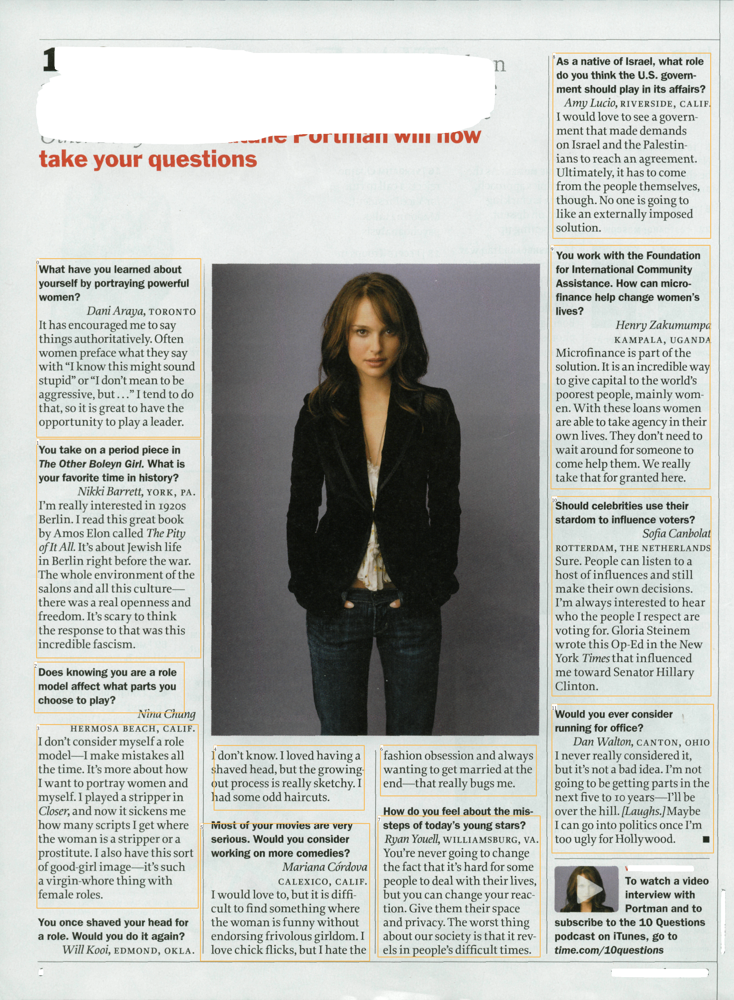

In [12]:
viz.draw_box(im, text_blocks,
            box_width=3, 
            show_element_id=True)

# OCR Engine
For the OCR engine Tesseract OCR is used, development of the engine has been sponsored by Google since 2006. We make API calls to the OCR for each ordered paragraph box.

In [13]:
arr_im = np.asarray(im)

for block in unions(text_blocks):
    segment_image = (block.crop_image(arr_im))
        # add padding in each image segment can help
        # improve robustness 
        
    text = ocr_agent.detect(segment_image)
    block.set(text=text, inplace=True)


for txt in text_blocks.get_texts():
    print(txt, end='\n---\n')

What have you learned about
yourself by portraying powerful
women?

Dani Araya, TORONTO
It has encouraged me to say
things authoritatively. Often
women preface what they say
with “I know this might sound
stupid” or “I don’t mean to be
aggressive, but...” I tend to do
that, so it is great to have the
opportunity to play a leader.

---
You take on a period piece in
The Other Boleyn Girl. What is
your favorite time in history?

Nikki Barrett, YORK, PA.
I’m really interested in 1920s
Berlin. I read this great book
by Amos Elon called The Pity
of It All. It’s about Jewish life
in Berlin right before the war.
The whole environment of the
salons and all this culture—
there was a real openness and
freedom. It’s scary to think
the response to that was this
incredible fascism.

---
Does knowing you are a role
model affect what parts you
choose to play?

nr... s*)1..

---
HERMOSA BEACH, CALIF.
I don’t consider myself a role
model—I make mistakes all
the time. It’s more about how
I want to port